In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle

In [2]:
def load_predictions(file_path):
    """Load the pickle file"""
    data = []
    with open(file_path, 'rb') as f:
        while True:
            try:
                data.append(pickle.load(f))
            except EOFError:
                break
    return data

def read(path):
    return pd.DataFrame(load_predictions(path))

In [36]:
df = pd.DataFrame(load_predictions('../comets-plus-aug-planets-binaries-extra-pred-test-ensemble.pkl'))
df.head(2)

,ID,t_pred,pred,is_interesting,original_time,original_flux,time,flux,predictions
0,23299676,1512.244971,0.117975,0,"[1491.6618797976773, 1491.6827132055535, 1491....","[1.0174524, 1.0316951, 1.0161155, 1.0084213, 1...","[1491.6618797976773, 1491.6827132055535, 1491....","[0.7871841, 0.93523526, 0.7732882, 0.6933078, ...","[0.0017691144021227956, 0.0017691144021227956,..."
1,32051290,1511.926390,0.089240,0,"[1491.6765803309377, 1491.6974133906344, 1491....","[0.96363294, 0.9692776, 0.98505753, 0.9885276,...","[1491.6765803309377, 1491.6974133906344, 1491....","[0.0, 0.10272815, 0.38990855, 0.45306063, 0.57...","[0.0017691144021227956, 0.0017691144021227956,..."


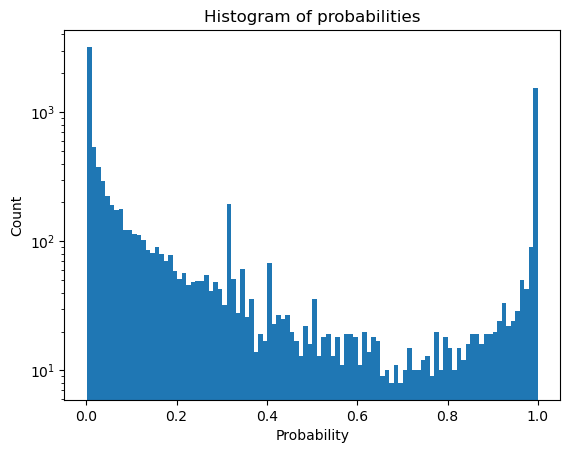

In [37]:
#plt.hist(df.pred.values,bins=100)
plt.hist(df.pred.values,bins=100,log=True)
plt.title('Histogram of probabilities')
plt.ylabel('Count')
plt.xlabel('Probability')
plt.savefig('hist.png',bbox_inches='tight')
plt.show();

In [38]:
df = df[df.pred > 0.99].reset_index()

,index,ID,t_pred,pred,is_interesting,original_time,original_flux,time,flux,predictions
0,2,36235639,1514.286829,0.998638,1,"[1491.661718276898, 1491.6825520652003, 1491.7...","[0.99978274, 0.99952686, 0.99811816, 0.9977258...","[1491.661718276898, 1491.6825520652003, 1491.7...","[0.8092754, 0.7864013, 0.66047347, 0.6254029, ...","[0.0017691144021227956, 0.0017691144021227956,..."
1,7,49380559,1510.556599,0.997069,1,"[1491.9110574168699, 1491.9318906683873, 1491....","[1.0068103, 1.0077856, 1.0046793, 1.0042375, 1...","[1491.9110574168699, 1491.9318906683873, 1491....","[0.927562, 1.0, 0.7692805, 0.73646605, 0.59665...","[0.0017691144021227956, 0.0017691144021227956,..."


In [39]:
len(df)

1545

## Light curves that show X consecutive points in their predictions

In [40]:
def filter_exactly_N_consecutive_points(df, exact_count=1, threshold=0.99):
    """
    Filter DataFrame to include only rows with EXACTLY N consecutive high probability 
    points and NO other high probability points.
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame with time, flux, predictions columns
    exact_count : int
        Exact number of consecutive high probability points to filter for
    threshold : float
        Threshold for high probability points
        
    Returns:
    --------
    pandas.DataFrame
        Filtered DataFrame containing only rows with exactly N consecutive high probability points
    """
    filtered_rows = []
    
    for i, row in df.iterrows():
        predictions = row.predictions
        
        # Find all high probability points
        high_prob_indices = [j for j, p in enumerate(predictions) if p >= threshold]
        
        if not high_prob_indices:
            continue
            
        # Check if total number of high probability points matches exact_count
        if len(high_prob_indices) != exact_count:
            continue
            
        # Check if they are all consecutive
        if high_prob_indices[-1] - high_prob_indices[0] + 1 != exact_count:
            continue
            
        # If we get here, we have exactly N consecutive points and no others
        filtered_rows.append(i)
    
    filtered_df = df.loc[filtered_rows].reset_index(drop=True)
    print(f"Found {len(filtered_df)} lightcurves with exactly {exact_count} consecutive high probability points and no other high prob points")
    
    return filtered_df

def plot_high_prob_events(df, threshold=0.99, window_size=20, num_to_show=10):
    """
    Visualize lightcurves with high probability points, showing probability values
    for neighboring points with improved alignment.
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame with time, flux, predictions columns
    threshold : float
        Threshold for high probability points
    window_size : int
        Window size around max prediction to analyze
    num_to_show : int
        Number of examples to visualize
    """
    import numpy as np
    import matplotlib.pyplot as plt
    
    # Visualize the events
    for i, row in df.head(num_to_show).iterrows():
        time = row.time
        flux = row.flux
        predictions = row.predictions
        original_time = row.original_time
        original_flux = row.original_flux
        
        # Find all high probability points
        high_prob_indices = [j for j, p in enumerate(predictions) if p >= threshold]
        
        if not high_prob_indices:
            print(f"No high probability points found for row {i}")
            continue
        
        # Group consecutive indices
        groups = []
        current_group = [high_prob_indices[0]]
        
        for j in range(1, len(high_prob_indices)):
            if high_prob_indices[j] == high_prob_indices[j-1] + 1:
                current_group.append(high_prob_indices[j])
            else:
                groups.append(current_group)
                current_group = [high_prob_indices[j]]
        
        # Add the last group
        groups.append(current_group)
        
        # Find the largest consecutive group (or first group if tie)
        largest_group = max(groups, key=len)
        
        # Use the middle of the largest consecutive group as the center point
        center_idx = largest_group[len(largest_group) // 2]
            
        # Create window around center point
        start_idx = max(0, center_idx - window_size)
        end_idx = min(len(time), center_idx + window_size + 1)
        
        # Create figure with three subplots
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 4))
        
        # Left plot: Original data
        ax1.plot(original_time, original_flux, '.', markersize=2)
        ax1.set_title(f'Original Data - ID: {row.get("ID", i)}')
        ax1.set_xlabel('Time')
        ax1.set_ylabel('Flux')
        
        # Middle plot: Predictions
        scatter = ax2.scatter(time, flux, c=predictions, s=5, cmap='viridis', vmin=0, vmax=1)
        ax2.set_title('Predictions')
        ax2.set_xlabel('Time')
        ax2.set_ylabel('Flux')
        fig.colorbar(scatter, ax=ax2, label='Prediction Score')
        
        # Right plot: Zoomed high probability region
        zoom_time = time[start_idx:end_idx]
        zoom_flux = flux[start_idx:end_idx]
        zoom_preds = predictions[start_idx:end_idx]
        
        # Plot all points
        ax3.scatter(zoom_time, zoom_flux, c='blue', s=5)
        
        # Highlight all high probability points in red
        for hp_idx in high_prob_indices:
            if start_idx <= hp_idx < end_idx:
                hp_offset = hp_idx - start_idx
                ax3.plot(zoom_time[hp_offset], zoom_flux[hp_offset], 'ro', markersize=8)
        
        # Add green shading for consecutive groups
        for group in groups:
            if start_idx <= group[0] and group[-1] < end_idx:
                group_min_idx = group[0] - start_idx
                group_max_idx = group[-1] - start_idx
                if group_min_idx >= 0 and group_max_idx < len(zoom_time):
                    ax3.axvspan(zoom_time[group_min_idx], zoom_time[group_max_idx], 
                                color='green', alpha=0.3)
        
        # Add a text annotation with details
        consec_counts = [len(g) for g in groups]
        ax3.text(0.05, 0.95, 
                 f"High prob points: {len(high_prob_indices)}\n"
                 f"Consecutive groups: {len(groups)}\n"
                 f"Largest group: {max(consec_counts)} points", 
                 transform=ax3.transAxes, fontsize=12,
                 verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        
        ax3.set_title('Zoomed High Probability Region')
        ax3.set_xlabel('Time')
        ax3.set_ylabel('Flux')
        
        # Add window highlight to other plots
        window_time_min = zoom_time[0]
        window_time_max = zoom_time[-1]
        for ax in [ax1, ax2]:
            ax.axvspan(window_time_min, window_time_max, color='red', alpha=0.2)
        
        # Get the range of flux values to calculate appropriate offset
        yrange = ax3.get_ylim()[1] - ax3.get_ylim()[0]
        yoffset = yrange * 0.05  # 5% of the y-range
        
        # Add probability values with connecting lines for clarity
        # Focus on the largest consecutive group
        for idx in largest_group:
            if start_idx <= idx < end_idx:
                j = idx - start_idx
                prob_value = zoom_preds[j]
                
                # Draw a connecting line
                ax3.plot([zoom_time[j], zoom_time[j]], 
                         [zoom_flux[j], zoom_flux[j] - yoffset], 
                         'k-', linewidth=0.5, alpha=0.7)
                
                # Add the text directly below the point
                ax3.text(zoom_time[j], zoom_flux[j] - yoffset - yrange*0.02, 
                         f"{prob_value:.3f}", 
                         ha='center', va='top', fontsize=9, 
                         bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))
        
        plt.tight_layout()
        plt.show()

Found 29 lightcurves with exactly 1 consecutive high probability points and no other high prob points


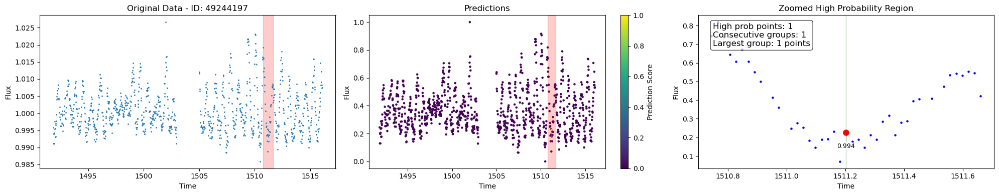

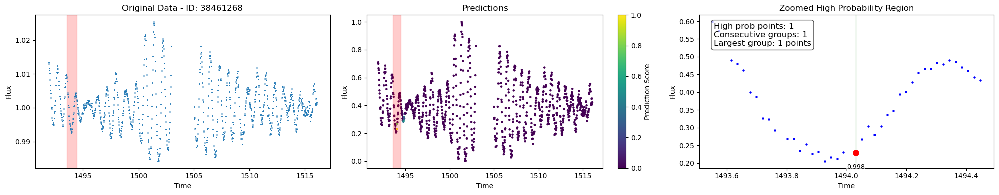

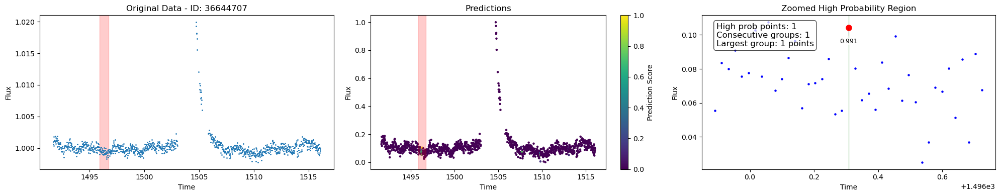

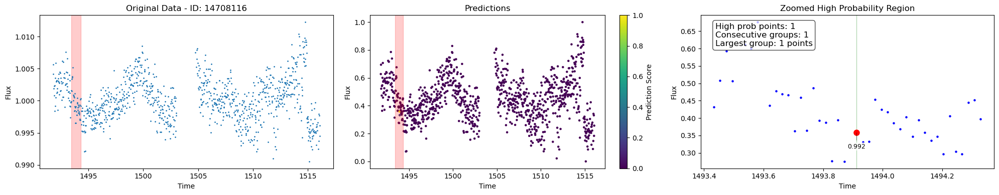

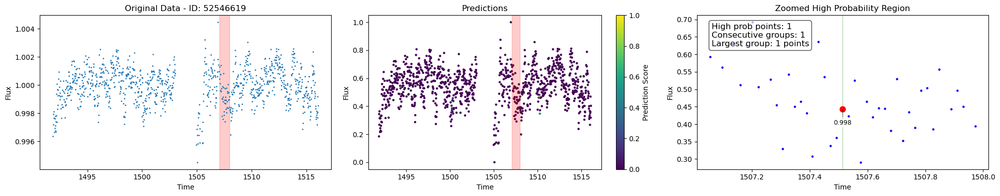

...

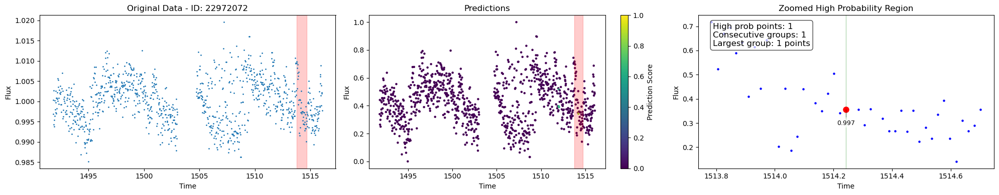

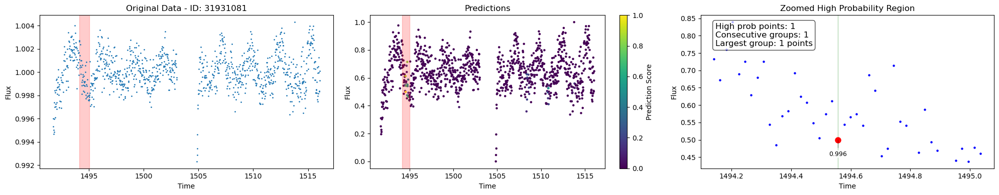

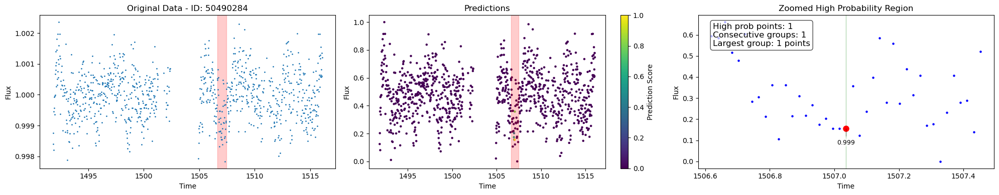

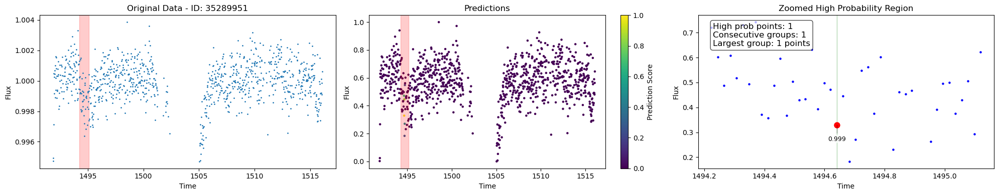

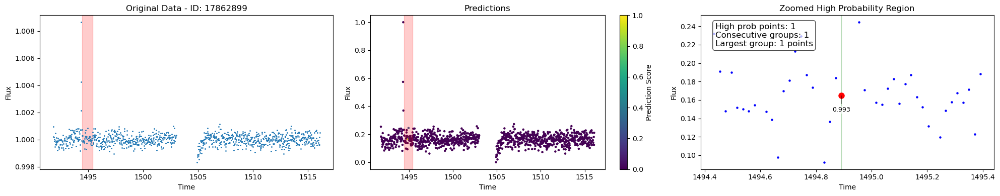

In [144]:
single_point_df = filter_exactly_N_consecutive_points(df, exact_count=1,threshold=0.90)

plot_high_prob_events(single_point_df, num_to_show=30)

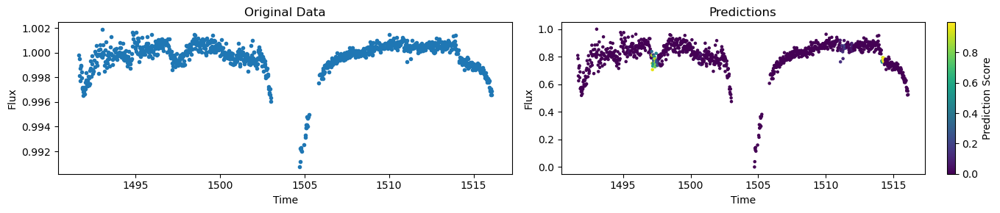

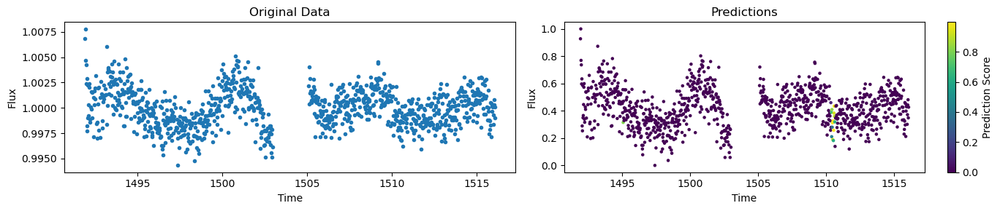

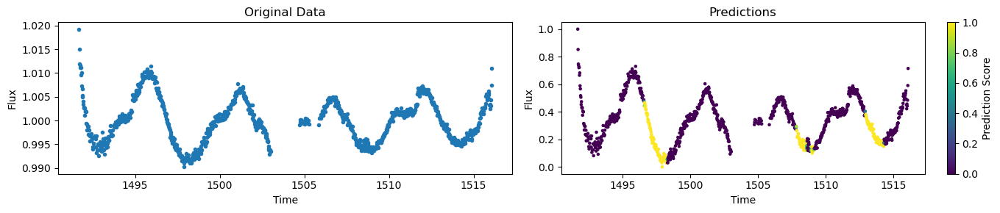

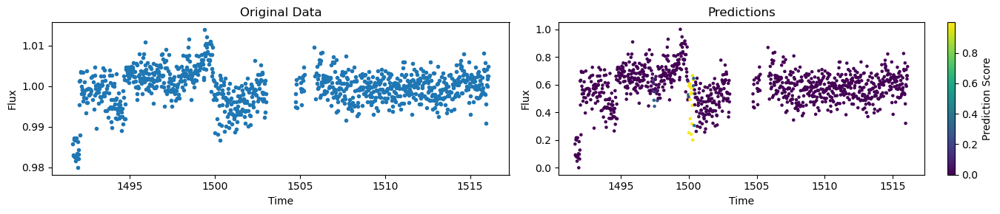

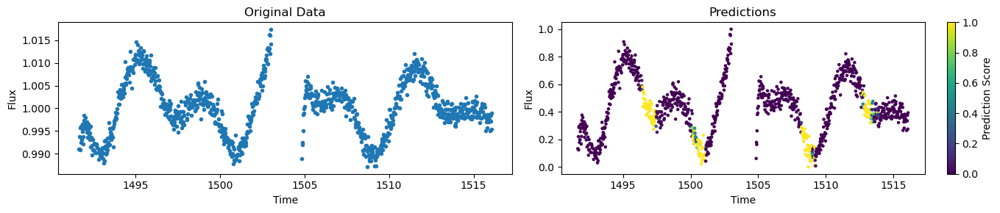

In [44]:
for i in df.index[0:5]:
    # Extract data for this index
    time = df.loc[i].time
    flux = df.loc[i].flux
    preds = df.loc[i].predictions
    original_time = df.loc[i].original_time
    original_flux = df.loc[i].original_flux
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 3))
    
    # Add a common title for the entire figure
    #fig.suptitle(f'Exocomet Analysis - Sample {i}', fontsize=16)
    plt.subplots_adjust(top=0.9)  # Make room for the title
    
    # Left plot: Scatter plot with predictions as colors
    scatter = ax2.scatter(time, flux, c=preds, s=5, cmap='viridis')
    ax2.set_title('Predictions')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Flux')
    fig.colorbar(scatter, ax=ax2, label='Prediction Score',cmap='viridis')
    
    # Right plot: Original time/flux
    ax1.plot(original_time, original_flux, '.')
    ax1.set_title('Original Data')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Flux')
    
    plt.tight_layout()
    plt.savefig(f'{i}-preds.png',dpi=300,bbox_inches='tight')
    plt.show()

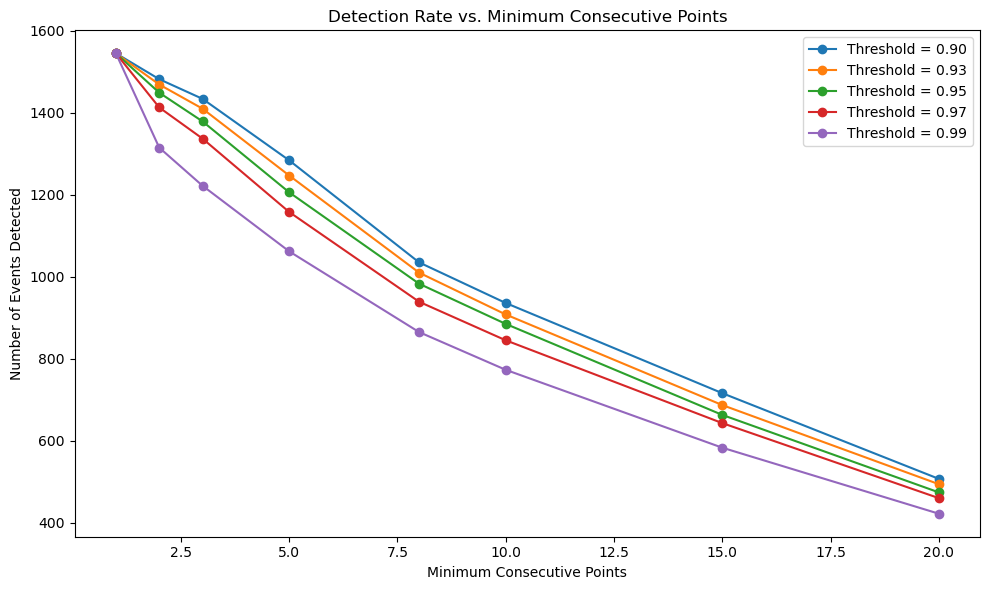

In [45]:

# Function to find runs of consecutive points above threshold
def find_consecutive_runs(predictions, threshold):
    # Create binary array where 1 = prediction > threshold
    above_threshold = np.array(predictions) > threshold
    
    # Find runs of consecutive True values
    runs = []
    current_run = 0
    max_run = 0
    
    for val in above_threshold:
        if val:
            current_run += 1
        else:
            max_run = max(max_run, current_run)
            current_run = 0
            
    # Check final run
    max_run = max(max_run, current_run)
    
    return max_run

# Test different thresholds and min_consecutive values
def analyze_detections(df, thresholds, min_consecutives):
    results = []
    
    for threshold in thresholds:
        for min_consecutive in min_consecutives:
            detected = 0
            
            for idx, row in df.iterrows():
                predictions = row['predictions']
                max_run = find_consecutive_runs(predictions, threshold)
                
                if max_run >= min_consecutive:
                    detected += 1
            
            results.append({
                'threshold': threshold,
                'min_consecutive': min_consecutive,
                'detected': detected,
            })
    
    return pd.DataFrame(results)

# Define parameters to test
thresholds = [0.90, 0.93, 0.95, 0.97, 0.99]
min_consecutives = [1,2,3, 5, 8, 10, 15, 20]

# Run analysis
results = analyze_detections(df, thresholds, min_consecutives)

# Plot results
plt.figure(figsize=(10, 6))
for threshold in thresholds:
    subset = results[results['threshold'] == threshold]
    plt.plot(subset['min_consecutive'], subset['detected'], 'o-', 
             label=f'Threshold = {threshold:.2f}')

plt.xlabel('Minimum Consecutive Points')
plt.ylabel('Number of Events Detected')
plt.title('Detection Rate vs. Minimum Consecutive Points')
plt.legend()
plt.tight_layout()

# Also create a visualization of a few example lightcurves
def plot_examples(df, threshold, min_consecutive, num_examples=3):
    count = 0
    
    for idx, row in df.iterrows():
        if count >= num_examples:
            break
            
        predictions = row['predictions']
        time = row['time']
        flux = row['flux']
        
        # Find runs above threshold
        above_threshold = np.array(predictions) > threshold
        
        # Find all runs
        runs = []
        run_start = None
        
        for i, val in enumerate(above_threshold):
            if val and run_start is None:
                run_start = i
            elif not val and run_start is not None:
                if i - run_start >= min_consecutive:
                    runs.append((run_start, i-1))
                run_start = None
                
        # Check final run
        if run_start is not None and len(above_threshold) - run_start >= min_consecutive:
            runs.append((run_start, len(above_threshold)-1))
            
        if runs:
            fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8,6), sharex=True)
            
            # Plot flux
            ax1.plot(time, flux, 'b-')
            ax1.set_title(f'Flux (ID: {row["ID"]}, pred: {row["pred"]:.4f})')
            ax1.set_ylabel('Flux')
            
            # Plot predictions
            ax2.plot(time, predictions, 'r-')
            ax2.axhline(y=threshold, color='g', linestyle='--', 
                      label=f'Threshold ({threshold:.2f})')
            
            # Highlight runs
            for start, end in runs:
                ax2.axvspan(time[start], time[end], 
                          alpha=0.2, color='green')
            
            ax2.set_title(f'Predictions (≥{min_consecutive} consecutive points > {threshold:.2f})')
            ax2.set_xlabel('Time')
            ax2.set_ylabel('Prediction')
            ax2.legend()
            ax2.set_ylim(0, 1.05)
            
            plt.tight_layout()
            plt.show()
            
            count += 1


## This code filters down the number of candidates by increasing the number of consecutive points as a requirement

In [17]:
def candidate_filtering(row, consecutive_points=20, threshold=0.99):
    time = row["time"]
    flux = row["flux"]
    preds = row["predictions"]

    # Find the index of the highest prediction
    max_idx = np.argmax(preds)
    highest_pred = preds[max_idx]
    highest_tpred = time[max_idx]

    # Define the range of indices to check
    lower_idx = max(0, max_idx - consecutive_points)  
    upper_idx = min(len(preds) - 1, max_idx + consecutive_points) 

    if np.all(preds[lower_idx : upper_idx + 1] > threshold):
        return True  
    else:
        return False  



In [46]:
filtered_df = df[df.apply(lambda row: candidate_filtering(row, consecutive_points=1, threshold=0.9), axis=1)]

In [47]:
filtered_df

,index,ID,t_pred,pred,is_interesting,original_time,original_flux,time,flux,predictions
0,2,36235639,1514.286829,0.998638,1,"[1491.661718276898, 1491.6825520652003, 1491.7...","[0.99978274, 0.99952686, 0.99811816, 0.9977258...","[1491.661718276898, 1491.6825520652003, 1491.7...","[0.8092754, 0.7864013, 0.66047347, 0.6254029, ...","[0.0017691144021227956, 0.0017691144021227956,..."
2,8,25788716,1496.807672,1.000000,1,"[1491.68257186574, 1491.7034056716454, 1491.72...","[1.0192355, 1.0149585, 1.0118936, 1.0115464, 1...","[1491.68257186574, 1491.7034056716454, 1491.72...","[1.0, 0.8526855, 0.7471207, 0.73515993, 0.7204...","[0.0017691144021227956, 0.0017691144021227956,..."
3,11,25794869,1500.162035,0.999797,1,"[1491.6618993836332, 1491.682733177056, 1491.7...","[0.985749, 0.9830892, 0.982867, 0.98683244, 0....","[1491.6618993836332, 1491.682733177056, 1491.7...","[0.17107219, 0.09314716, 0.08663711, 0.2028139...","[0.0017691144021227956, 0.0017691144021227956,..."
4,13,19767187,1496.536455,1.000000,1,"[1491.6613006053312, 1491.6821346555612, 1491....","[0.9910542, 0.99102736, 0.9937415, 0.99080306,...","[1491.6613006053312, 1491.6821346555612, 1491....","[0.13205905, 0.13117741, 0.22039232, 0.1238048...","[0.0017691144021227956, 0.0017691144021227956,..."
5,26,49253346,1508.160710,0.995305,1,"[1491.8276028447463, 1491.8484360898126, 1491....","[0.98284495, 0.9855409, 0.9872909, 0.9893289, ...","[1491.8276028447463, 1491.8484360898126, 1491....","[0.0, 0.0981452, 0.16185246, 0.23604451, 0.278...","[0.0017691144021227956, 0.0017691144021227956,..."
...,...,...,...,...,...,...,...,...,...,...
1540,9933,19074740,1512.307705,0.999995,1,"[1491.7657263143833, 1491.7865602714758, 1491....","[1.0110419, 1.0094858, 1.0091357, 1.0079988, 1...","[1491.7657263143833, 1491.7865602714758, 1491....","[1.0, 0.9243837, 0.9073696, 0.85212153, 0.7789...","[0.0017691144021227956, 0.0017691144021227956,..."
1541,9951,25080324,1511.218222,0.999993,1,"[1491.88508564149, 1491.9059187062057, 1491.92...","[0.9971333, 1.0000565, 0.9981216, 0.99815816, ...","[1491.88508564149, 1491.9059187062057, 1491.92...","[0.15692605, 0.54316133, 0.28750876, 0.2923364...","[0.0017691144021227956, 0.0017691144021227956,..."
1542,9972,54472013,1495.452869,1.000000,1,"[1491.6611203797545, 1491.6819542010765, 1491....","[1.002023, 1.0008398, 1.0000321, 0.9998813, 0....","[1491.6611203797545, 1491.6819542010765, 1491....","[0.63976777, 0.5367895, 0.46648407, 0.45336404...","[0.0017691144021227956, 0.0017691144021227956,..."
1543,9974,25116926,1506.864230,0.999758,1,"[1491.781106340658, 1491.8019393447569, 1491.8...","[0.9939131, 0.9947019, 0.99560744, 0.997333, 0...","[1491.781106340658, 1491.8019393447569, 1491.8...","[0.0, 0.074783996, 0.16063245, 0.32422596, 0.2...","[0.0017691144021227956, 0.0017691144021227956,..."


In [112]:
for i in df.index:
    # Extract data for this index
    time = df.loc[i].time
    flux = df.loc[i].flux
    preds = df.loc[i].predictions
    original_time = df.loc[i].original_time
    original_flux = df.loc[i].original_flux
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 3))
    
    # Add a common title for the entire figure
    #fig.suptitle(f'Exocomet Analysis - Sample {i}', fontsize=16)
    plt.subplots_adjust(top=0.9)  # Make room for the title
    
    # Left plot: Scatter plot with predictions as colors
    scatter = ax2.scatter(time, flux, c=preds, s=5, cmap='viridis')
    ax2.set_title('Predictions')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Flux')
    fig.colorbar(scatter, ax=ax2, label='Prediction Score',cmap='viridis')
    
    # Right plot: Original time/flux
    ax1.plot(original_time, original_flux, '.')
    ax1.set_title('Original Data')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Flux')
    
    plt.tight_layout()
    plt.savefig(f'{i}-preds.png',dpi=300,bbox_inches='tight')
    plt.show()

AttributeError: 'numpy.int64' object has no attribute 'index'

---

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

def process_df_detections(df):
    """
    Process each row in your dataframe that contains lightcurve predictions
    Returns a list of all detected regions across all lightcurves
    """
    all_regions = []
    
    for i, row in tqdm(df.iterrows(), total=len(df)):
        try:
            # Extract necessary arrays from your dataframe
            time = row['time']
            predictions = row['predictions']
            original_flux = row['original_flux']
            
            # Process each threshold
            for threshold in [0.90, 0.93, 0.95, 0.97, 0.99]:
                # Find regions for this threshold
                regions = find_high_prediction_regions(predictions, time, threshold)
                
                # Add source info to each region
                for region in regions:
                    region['threshold'] = threshold
                    region['ID'] = row['ID']
                    region['row_index'] = i
                    all_regions.append(region)
        except:
            # Skip rows with missing data
            continue
    
    return all_regions

def find_high_prediction_regions(predictions, time, threshold=0.9):
    """
    Find all regions in a light curve where predictions exceed threshold
    Returns a list of dictionaries with information about each region
    """
    # Find indices where predictions exceed threshold
    high_indices = np.where(predictions >= threshold)[0]
    
    if len(high_indices) == 0:
        return []
    
    # Group consecutive indices
    regions = []
    current_region = [high_indices[0]]
    
    for i in range(1, len(high_indices)):
        # If this index is consecutive with previous one
        if high_indices[i] == high_indices[i-1] + 1:
            current_region.append(high_indices[i])
        else:
            # Store the completed region and start a new one
            if len(current_region) > 0:
                region_info = analyze_region(current_region, predictions, time)
                regions.append(region_info)
            current_region = [high_indices[i]]
    
    # Add the last region
    if len(current_region) > 0:
        region_info = analyze_region(current_region, predictions, time)
        regions.append(region_info)
    
    return regions

def analyze_region(indices, predictions, time):
    """Generate statistics for a high-prediction region"""
    max_pred_idx = indices[np.argmax(predictions[indices])]
    
    return {
        'start_idx': indices[0],
        'end_idx': indices[-1],
        'length': len(indices),  # Number of consecutive points
        'max_pred': predictions[max_pred_idx],
        'max_pred_time': time[max_pred_idx],
        'avg_pred': np.mean(predictions[indices]),
        'duration': time[indices[-1]] - time[indices[0]],  # Time span of event
        'indices': indices  # Store actual indices for later reference
    }

def generate_min_consecutive_points_plot(all_regions, save_path='detection_sensitivity.png'):
    """
    Generate the "Detection Rate vs. Minimum Consecutive Points" plot
    This is the function that creates your Image 2
    """
    # Define parameters
    thresholds = [0.90, 0.93, 0.95, 0.97, 0.99]
    min_consecutive_points = [1, 2,3 , 5, 8, 10, 12, 15, 20]
    
    # Initialize counts matrix
    event_counts = np.zeros((len(thresholds), len(min_consecutive_points)))
    
    # Count events that meet each criteria
    for i, threshold in enumerate(thresholds):
        threshold_regions = [r for r in all_regions if r['threshold'] == threshold]
        
        for j, min_points in enumerate(min_consecutive_points):
            # Count regions with at least min_points consecutive points
            count = sum(1 for r in threshold_regions if r['length'] >= min_points)
            event_counts[i, j] = count
    
    # Plot the results
    plt.figure(figsize=(10, 6))
    
    for i, threshold in enumerate(thresholds):
        plt.plot(min_consecutive_points, event_counts[i], 
                 marker='o', label=f'Threshold = {threshold:.2f}')
    
    plt.xlabel('Minimum Consecutive Points')
    plt.ylabel('Number of Events Detected')
    plt.title('Detection Rate vs. Minimum Consecutive Points')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.show()
    
    return event_counts

def create_filtered_catalog(all_regions, threshold=0.95, min_points=5):
    """
    Create a filtered catalog of exocomet candidates based on your criteria
    """
    # Filter regions that meet your criteria
    candidates = [
        r for r in all_regions 
        if r['threshold'] >= threshold and r['length'] >= min_points
    ]
    
    # Convert to DataFrame for easier analysis
    df_candidates = pd.DataFrame(candidates)
    
    # Drop the 'indices' column which might cause issues when saving
    if 'indices' in df_candidates.columns:
        df_candidates = df_candidates.drop('indices', axis=1)
    
    # Save to CSV
    df_candidates.to_csv(f'exocomet_candidates_t{threshold}_p{min_points}.csv', index=False)
    
    print(f"Found {len(df_candidates)} candidate events with threshold={threshold} and min_points={min_points}")
    return df_candidates

# Example usage
def main(df):
    # Process all lightcurves to find high-prediction regions
    all_regions = process_df_detections(df)
    
    # Generate the min consecutive points plot (your Image 2)
    event_counts = generate_min_consecutive_points_plot(all_regions)
    
    # Create filtered catalogs with different criteria
    conservative_catalog = create_filtered_catalog(all_regions, threshold=0.97, min_points=5)
    balanced_catalog = create_filtered_catalog(all_regions, threshold=0.95, min_points=3)
    
    # Visualize some examples
    visualize_example_events(df, all_regions)
    
    return all_regions, conservative_catalog, balanced_catalog

def visualize_example_events(df, all_regions, consecutive_counts=[1, 3, 5, 10, 15]):
    """
    Visualize example light curves with different numbers of consecutive high predictions
    """
    # Find examples for each consecutive count
    for count in consecutive_counts:
        # Find regions with exactly this count of consecutive points
        count_regions = [r for r in all_regions if r['length'] == count]
        
        if not count_regions:
            continue
            
        # Take up to 3 examples
        examples = count_regions[:min(3, len(count_regions))]
        
        fig, axes = plt.subplots(len(examples), 1, figsize=(12, 5*len(examples)))
        if len(examples) == 1:
            axes = [axes]
            
        for i, region in enumerate(examples):
            # Get the row data
            row_idx = region['row_index']
            row = df.iloc[row_idx]
            
            # Get window around the region
            padding = 20
            start_idx = max(0, region['start_idx'] - padding)
            end_idx = min(len(row['time']), region['end_idx'] + padding)
            
            # Plot
            ax = axes[i]
            ax2 = ax.twinx()
            
            # Plot flux
            time_window = row['time'][start_idx:end_idx]
            flux_window = row['original_flux'][start_idx:end_idx]
            ax.plot(time_window, flux_window, 'b-', label='Flux')
            
            # Plot predictions
            pred_window = row['predictions'][start_idx:end_idx]
            ax2.plot(time_window, pred_window, 'r-', label='Predictions')
            
            # Highlight high-prediction region
            region_indices = [idx for idx in region['indices'] if start_idx <= idx < end_idx]
            region_indices = [idx - start_idx for idx in region_indices]
            if region_indices:
                ax2.fill_between(
                    time_window[region_indices], 
                    0, 
                    pred_window[region_indices], 
                    alpha=0.3, 
                    color='red'
                )
            
            # Labels
            ax.set_ylabel('Normalized Flux')
            ax2.set_ylabel('Prediction Score')
            ax.set_xlabel('Time (BJD)')
            
            # Title
            ax.set_title(f"ID: {row['ID']}, {count} Consecutive Points\n"
                        f"Max Pred: {region['max_pred']:.3f}, Duration: {region['duration']:.4f} days")
            
            # Legend
            lines1, labels1 = ax.get_legend_handles_labels()
            lines2, labels2 = ax2.get_legend_handles_labels()
            ax.legend(lines1 + lines2, labels1 + labels2, loc='upper right')
        
        plt.tight_layout()
        plt.savefig(f'example_events_{count}_points.png', dpi=300)
        plt.show()

100%|███████████████████████| 1545/1545 [00:00<00:00, 1729.53it/s]


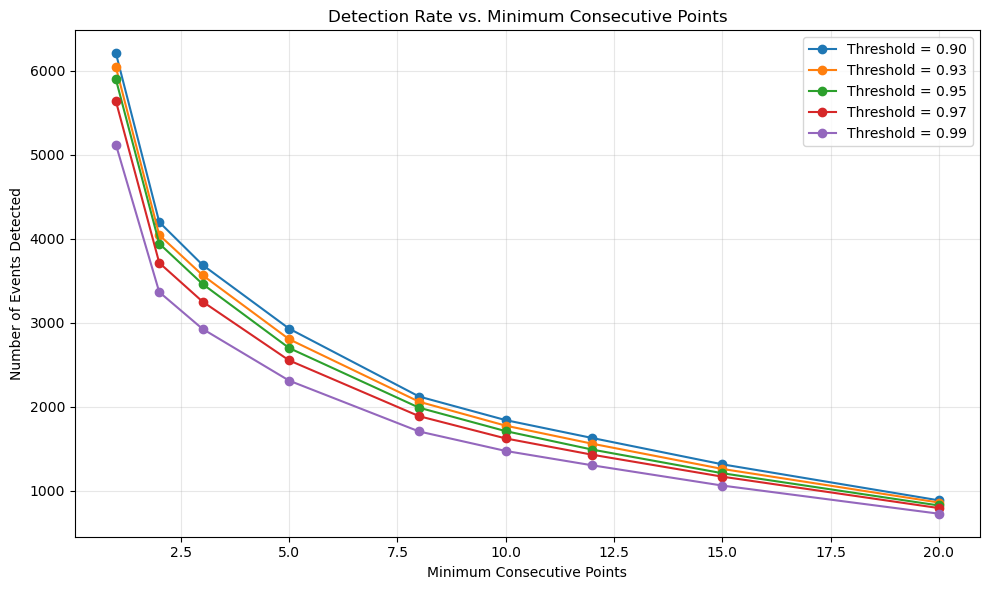

Found 4861 candidate events with threshold=0.97 and min_points=5
Found 9638 candidate events with threshold=0.95 and min_points=3


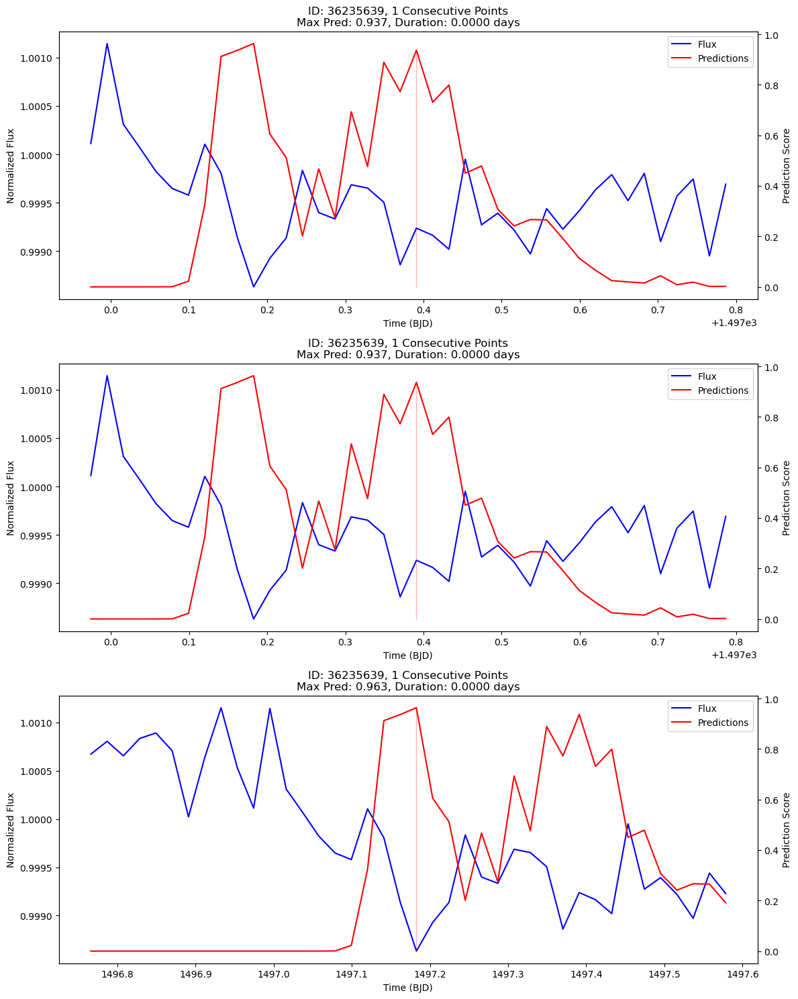

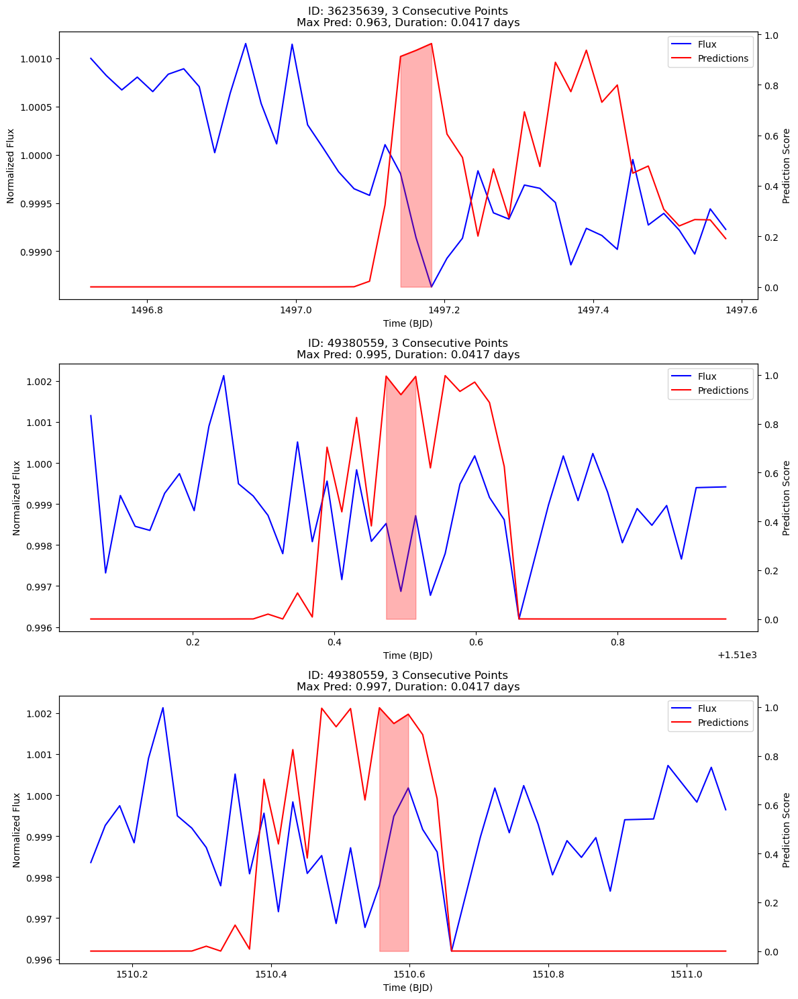

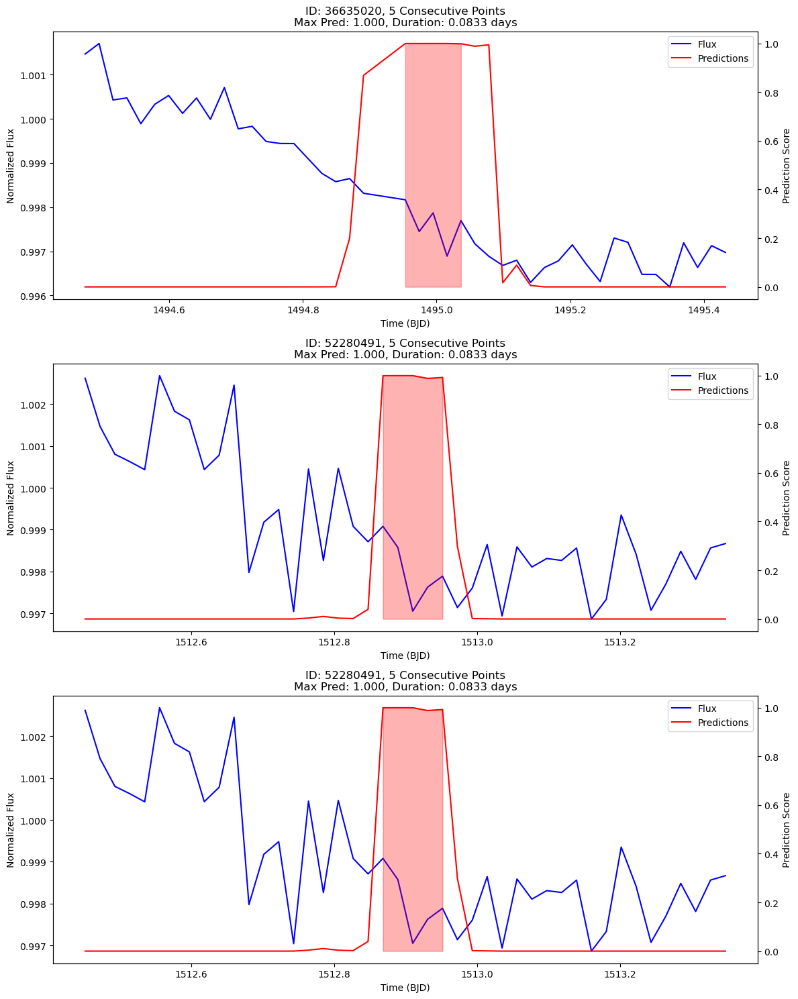

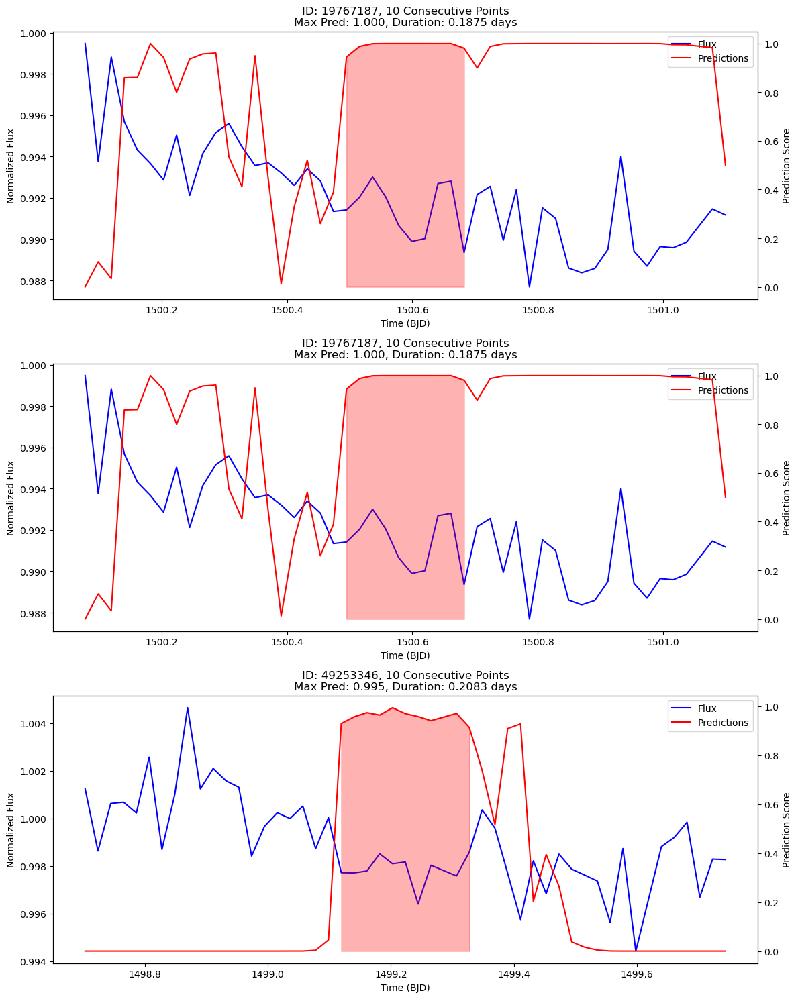

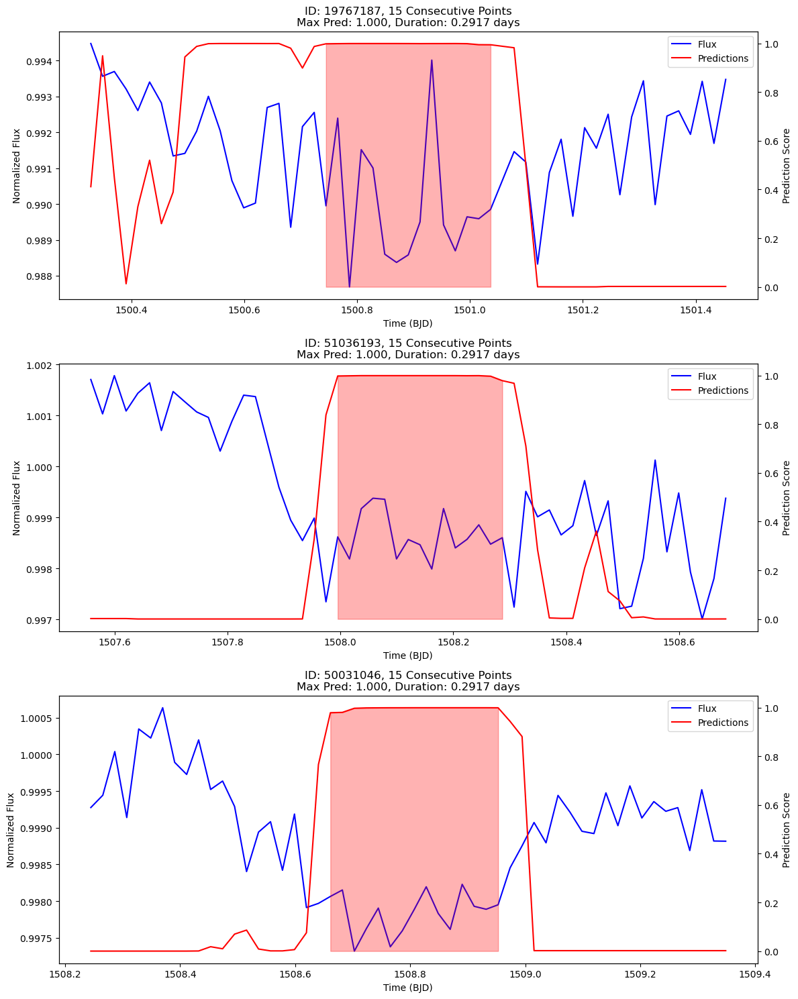

In [54]:
all_regions, conservative_catalog, balanced_catalog = main(df)

In [57]:
test = pd.DataFrame(all_regions)
test = test[test.length > 20]

In [58]:
test

,start_idx,end_idx,length,max_pred,max_pred_time,avg_pred,duration,indices,threshold,ID,row_index
26,220,298,79,1.0,1496.807672,0.999657,1.645857,"[220, 221, 222, 223, 224, 225, 226, 227, 228, ...",0.90,25788716,2
27,637,670,34,1.0,1507.974413,0.996688,0.708332,"[637, 638, 639, 640, 641, 642, 643, 644, 645, ...",0.90,25788716,2
29,879,941,63,1.0,1513.120214,0.999683,1.312486,"[879, 880, 881, 882, 883, 884, 885, 886, 887, ...",0.90,25788716,2
30,220,298,79,1.0,1496.807672,0.999657,1.645857,"[220, 221, 222, 223, 224, 225, 226, 227, 228, ...",0.93,25788716,2
31,637,669,33,1.0,1507.974413,0.998801,0.687499,"[637, 638, 639, 640, 641, 642, 643, 644, 645, ...",0.93,25788716,2
...,...,...,...,...,...,...,...,...,...,...,...
28893,261,296,36,1.0,1497.847577,0.998863,0.749990,"[261, 262, 263, 264, 265, 266, 267, 268, 269, ...",0.97,51785203,1544
28896,844,878,35,1.0,1512.993097,0.999506,0.708313,"[844, 845, 846, 847, 848, 849, 850, 851, 852, ...",0.97,51785203,1544
28897,110,141,32,1.0,1494.639281,0.999515,0.749992,"[110, 111, 112, 113, 114, 115, 116, 117, 118, ...",0.99,51785203,1544
28898,262,295,34,1.0,1497.847577,0.999991,0.708324,"[262, 263, 264, 265, 266, 267, 268, 269, 270, ...",0.99,51785203,1544


In [94]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize

def find_high_prediction_regions_relaxed(predictions, time, threshold=0.9, max_gap=2):
    """
    Find regions with high predictions, allowing small gaps between consecutive points
    
    Parameters:
    -----------
    predictions : array-like
        Prediction scores
    time : array-like
        Time values
    threshold : float
        Threshold for high predictions
    max_gap : int
        Maximum allowed gap between consecutive points
    """
    # Find all indices above threshold
    high_indices = np.where(predictions >= threshold)[0]
    
    if len(high_indices) == 0:
        return []
    
    # Group indices allowing for small gaps
    regions = []
    current_region = [high_indices[0]]
    
    for i in range(1, len(high_indices)):
        # Check if this index is within max_gap of the previous one
        if high_indices[i] - high_indices[i-1] <= max_gap + 1:
            current_region.append(high_indices[i])
        else:
            # Gap too large, end current region
            region_info = analyse_region(current_region, predictions, time)
            regions.append(region_info)
            current_region = [high_indices[i]]
    
    # Add the last region
    if len(current_region) > 0:
        region_info = analyse_region(current_region, predictions, time)
        regions.append(region_info)
    
    return regions

def analyse_region(indices, predictions, time):
    """Generate statistics for a high-prediction region"""
    max_pred_idx = indices[np.argmax(predictions[indices])]
    
    return {
        'start_idx': min(indices),
        'end_idx': max(indices),
        'length': len(indices),  # Number of high points
        'max_pred': predictions[max_pred_idx],
        'max_pred_time': time[max_pred_idx],
        'avg_pred': np.mean(predictions[indices]),
        'duration': time[max(indices)] - time[min(indices)],  # Time span
        'indices': indices  # Store actual indices
    }

def plot_lightcurve_with_events_coloured(original_df, all_regions_df, id_to_plot=None, max_plots=10):
    """
    Plot lightcurves with all events, using colour to show prediction values
    """
    # Get sources to plot
    if id_to_plot is None:
        unique_sources = all_regions_df['row_index'].unique()
        if len(unique_sources) > max_plots:
            unique_sources = unique_sources[:max_plots]
    else:
        all_regions_df = all_regions_df[all_regions_df['ID'].isin(id_to_plot)]
        unique_sources = all_regions_df['row_index'].unique()
    
    # Create plots for each lightcurve
    for i, row_idx in enumerate(unique_sources):
        # Get original lightcurve data
        if row_idx >= len(original_df):
            print(f"Row index {row_idx} out of bounds. Skipping.")
            continue
            
        src_row = original_df.iloc[row_idx]
        
        # Get all events for this source
        src_events = all_regions_df[all_regions_df['row_index'] == row_idx]
        
        # Create the plot - adjust figure size based on number of events
        events_count = len(src_events)
        fig_width = min(15, 10 + events_count * 0.5)  # Wider for more events
        fig, ax = plt.subplots(figsize=(fig_width, 3))
        
        # Get data
        time = src_row['time']
        flux = src_row['original_flux']
        predictions = src_row['predictions']
        
        # Plot coloured by prediction using LineCollection
        points = np.array([time, flux]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        
        # Create a norm and LineCollection
        norm = Normalize(0, 1)  # Predictions range from 0 to 1
        lc = LineCollection(segments, cmap='viridis', norm=norm)
        lc.set_array(predictions)
        lc.set_linewidth(1.5)
        line = ax.add_collection(lc)
        
        # Add colourbar
        cbar = fig.colorbar(line, ax=ax)
        cbar.ax.set_ylabel('Prediction Score')
        
        # Set plot limits
        ax.set_xlim(time.min(), time.max())
        ax.set_ylim(flux.min() - 0.001, flux.max() + 0.001)
        
        # Mark and label each event
        event_colours = plt.cm.tab10(np.linspace(0, 1, len(src_events)))
        
        for j, (_, event) in enumerate(src_events.iterrows()):
            event_label = f"E{j+1}"
            
            # Highlight the event region
            start_time = time[event['start_idx']]
            end_time = time[event['end_idx']]
            
            # Add rectangle to highlight event
            rect = Rectangle(
                (start_time, min(flux) - 0.0005), 
                end_time - start_time, 
                max(flux) - min(flux) + 0.001,
                alpha=0.2, 
                color=event_colours[j % 10],
                label=f"{event_label} ({event['length']} pts)"
            )
            ax.add_patch(rect)
            
            # Add annotation arrow - stagger vertically to avoid overlap
            mid_idx = (event['start_idx'] + event['end_idx']) // 2
            mid_x = time[mid_idx]
            mid_y = flux[mid_idx]
            
            # Alternate label positions to avoid overlap
            label_offset = (j % 3 + 1) * 0.0005
            if j % 2 == 0:
                label_y = max(flux) + label_offset
            else:
                label_y = min(flux) - label_offset
            
            # Add arrow and label
            ax.annotate(
                event_label, 
                xy=(mid_x, mid_y),
                xytext=(mid_x, label_y),
                arrowprops=dict(arrowstyle='->', color=event_colours[j % 10], lw=1.5),
                color=event_colours[j % 10],
                fontsize=10,
                ha='center'
            )
        
        # Set labels and title
        ax.set_xlabel('Time (BJD)')
        ax.set_ylabel('Normalised Flux')
        ax.set_title(f"TIC ID: {src_row['ID']} - {len(src_events)} events detected")
        
        # Add legend with adjusted font size
        handles, labels = ax.get_legend_handles_labels()
        ax.legend(handles, labels, loc='upper right', fontsize=8)
        
        # Adjust layout and save
        plt.tight_layout()
        plt.savefig(f"source_{src_row['ID']}_events_coloured.png", dpi=300, bbox_inches='tight')
        plt.show()
        
        # Create zoomed views with dynamic sizing
        plot_zoomed_event_views_flexible(src_row, src_events, event_colours)

def plot_zoomed_event_views_flexible(src_row, src_events, colours):
    """Create panel of zoomed views with flexible sizing"""
    n_events = len(src_events)
    if n_events == 0:
        return
    
    # Calculate optimal layout
    n_cols = min(5, n_events)
    n_rows = (n_events + n_cols - 1) // n_cols
    
    # Create figure with flexible size
    fig_width = min(16, max(10, n_cols * 3))
    fig_height = max(4, n_rows * 2)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height))
    
    # Handle single row or column case
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    elif n_cols == 1:
        axes = axes.reshape(-1, 1)
    
    # Flatten for easier indexing
    axes_flat = axes.flatten()
    
    # Hide unused axes
    for i in range(n_events, len(axes_flat)):
        axes_flat[i].axis('off')
    
    time = src_row['time']
    flux = src_row['original_flux']
    predictions = src_row['predictions']
    
    for i, (_, event) in enumerate(src_events.iterrows()):
        ax = axes_flat[i]
        
        # Calculate window with dynamic padding
        padding = min(20, event['length'] * 2)  # Adjust padding based on event length
        start_idx = max(0, event['start_idx'] - padding)
        end_idx = min(len(time), event['end_idx'] + padding)
        
        # Get window data
        window_time = time[start_idx:end_idx]
        window_flux = flux[start_idx:end_idx]
        window_preds = predictions[start_idx:end_idx]
        
        # Plot with colour gradient
        points = np.array([window_time, window_flux]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        
        norm = Normalize(0, 1)
        lc = LineCollection(segments, cmap='viridis', norm=norm)
        lc.set_array(window_preds)
        lc.set_linewidth(1.5)
        ax.add_collection(lc)
        
        # Set plot limits
        ax.set_xlim(window_time.min(), window_time.max())
        ax.set_ylim(window_flux.min() - 0.0002, window_flux.max() + 0.0002)
        
        # Highlight event region
        event_start = max(start_idx, event['start_idx'])
        event_end = min(end_idx-1, event['end_idx'])
        
        ax.axvspan(
            time[event_start], 
            time[event_end], 
            alpha=0.2, 
            color=colours[i % 10]
        )
        
        # Set labels
        ax.set_title(f"Event {i+1} ({event['length']} pts)")
        if i % n_cols == 0:
            ax.set_ylabel('Flux')
        if i >= n_events - n_cols:
            ax.set_xlabel('Time (BJD)')
    
    # Add a shared colourbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(lc, cax=cbar_ax)
    cbar.ax.set_ylabel('Prediction Score')
    
    plt.tight_layout()
    plt.subplots_adjust(right=0.9)  # Make room for colourbar
    plt.savefig(f"source_{src_row['ID']}_zoomed_events.png", dpi=300, bbox_inches='tight')
    plt.show()

def process_with_relaxed_criteria(df, threshold=0.95, max_gap=2):
    """
    Process dataframe using relaxed consecutive point criteria
    
    Parameters:
    -----------
    df : pandas DataFrame
        Dataframe with lightcurve data
    threshold : float
        Threshold for predictions
    max_gap : int
        Maximum allowed gap between consecutive points
    """
    all_regions = []
    
    for i, row in df.iterrows():
        try:
            # Get data arrays
            time = row['time']
            predictions = row['predictions']
            
            # Find regions with relaxed criteria
            regions = find_high_prediction_regions_relaxed(
                predictions, time, threshold, max_gap=max_gap
            )
            
            # Add metadata to each region
            for region in regions:
                region['threshold'] = threshold
                region['ID'] = row['ID']
                region['row_index'] = i
                all_regions.append(region)
        except Exception as e:
            print(f"Error processing row {i}: {e}")
            continue
    
    return pd.DataFrame(all_regions)

def analyse_with_relaxed_criteria(original_df, threshold=0.95, min_points=3, max_gap=2):
    """Run analysis with relaxed consecutive point criteria"""
    # Process all lightcurves
    print(f"Finding events with threshold={threshold}, min_points={min_points}, max_gap={max_gap}...")
    all_regions_df = process_with_relaxed_criteria(original_df, threshold, max_gap)
    
    # Filter by minimum points
    filtered_regions = all_regions_df[all_regions_df['length'] >= min_points]
    
    # Count events per source
    event_counts = filtered_regions['row_index'].value_counts()
    multi_event_sources = event_counts[event_counts > 1]
    
    print(f"Found {len(filtered_regions)} total events")
    print(f"Found {len(multi_event_sources)} sources with multiple events")
    
    # Create visualisations for sources with multiple events
    sources_to_plot = multi_event_sources.index[:10]  # Limit to 10 sources
    plot_lightcurve_with_events_coloured(original_df, filtered_regions, 
                                        id_to_plot=original_df.iloc[sources_to_plot]['ID'].values)
    
    return all_regions_df, filtered_regions

Finding events with threshold=0.95, min_points=3, max_gap=1...
Found 3319 total events
Found 808 sources with multiple events


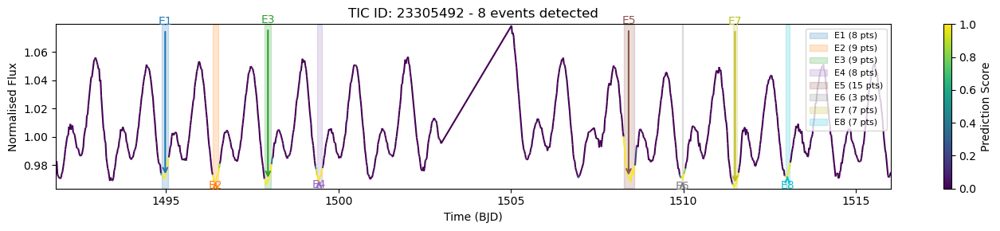

/var/folders/bv/h7ss9cs93lq15v21yc62bk600000gn/T/ipykernel_65649/2703112406.py:265: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


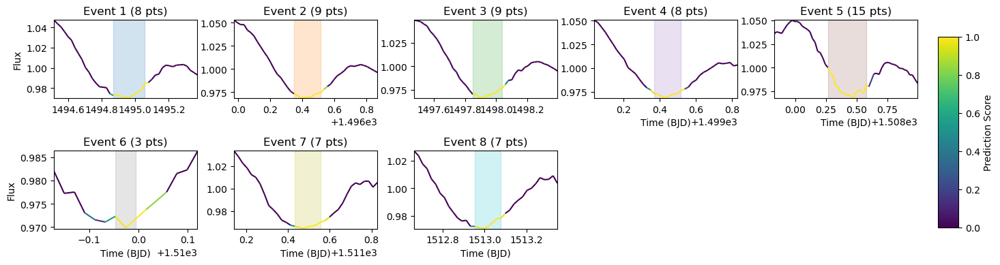

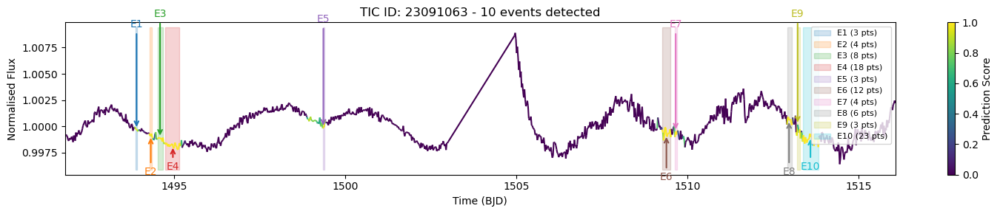

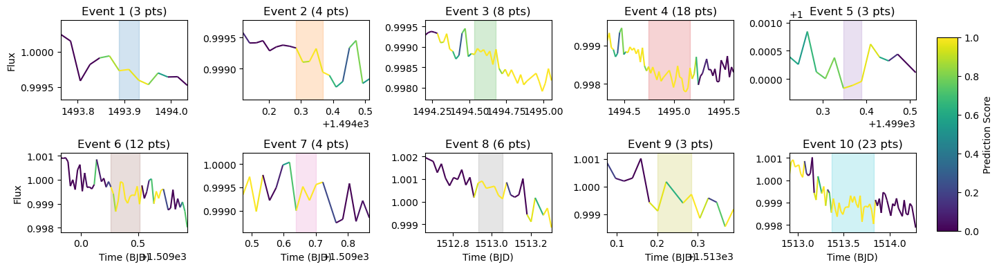

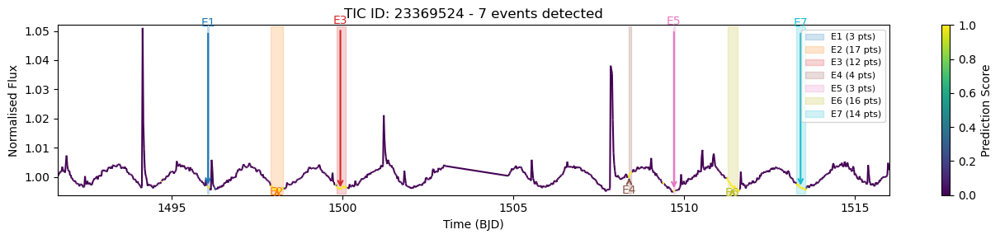

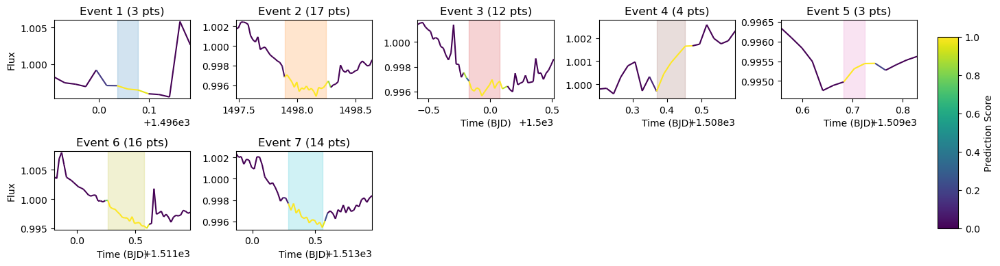

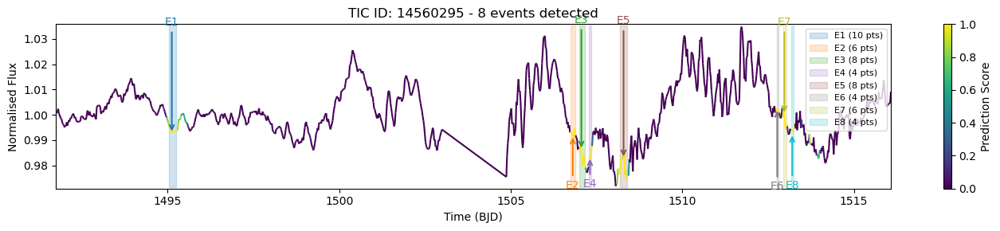

KeyboardInterrupt: 

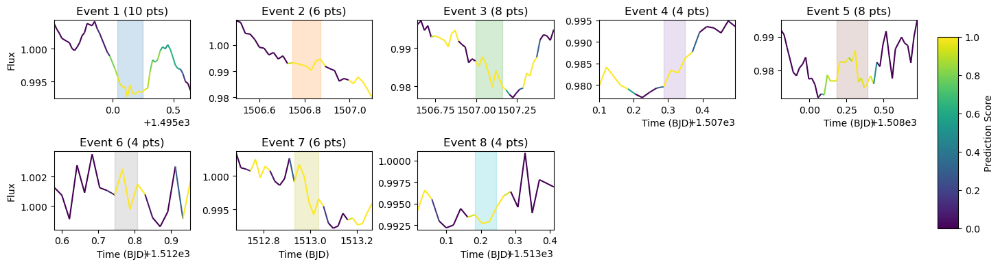

In [101]:
# Convert your existing dataframe to use the relaxed criteria
all_regions_relaxed, filtered_regions = analyse_with_relaxed_criteria(
    df,
    threshold=0.95,   # Prediction threshold
    min_points=3,     # Minimum points required (can be smaller with relaxed criteria)
    max_gap=1         # Maximum allowed gap between consecutive points
)

# To plot specific sources from your Image 1
specific_ids = [36235639, 25763716, 9728469]
plot_lightcurve_with_events_colored(df, filtered_regions, id_to_plot=specific_ids)

In [119]:
def generate_sensitivity_plot_with_relaxed_criteria(df, max_gap=2):
    """
    Generate the "Detection Rate vs. Minimum Consecutive Points" plot
    using relaxed consecutive point criteria
    
    Parameters:
    -----------
    original_df : DataFrame
        Your original dataframe with lightcurve data
    max_gap : int
        Maximum allowed gap between high prediction points
    """
    # Define parameters
    thresholds = [0.90, 0.93, 0.95, 0.97, 0.99]
    min_consecutive_points = [1, 2,3,5,8,10,15,20]
    
    # Initialize counts matrix
    event_counts = np.zeros((len(thresholds), len(min_consecutive_points)))
    
    
    # For each threshold, generate a new all_regions dataset
    for i, threshold in enumerate(thresholds):
        # Process all lightcurves with this threshold and relaxed criteria
        all_regions_df = process_with_relaxed_criteria(df, threshold, max_gap)
        
        # Count regions meeting each minimum point requirement
        for j, min_points in enumerate(min_consecutive_points):
            count = len(all_regions_df[all_regions_df['length'] >= min_points])
            event_counts[i, j] = count
    
    # Plot the results
    plt.figure(figsize=(12, 7))
    
    for i, threshold in enumerate(thresholds):
        plt.plot(min_consecutive_points, event_counts[i], 
                 marker='o', linewidth=2, markersize=8,
                 label=f'Threshold = {threshold:.2f}')
    
    plt.xlabel('Minimum Points in Region', fontsize=12)
    plt.ylabel('Number of Events Detected', fontsize=12)
    plt.title(f'Detection Rate vs. Minimum Points (max gap = {max_gap})', fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=10)
    plt.tight_layout()
    
    # Save with max_gap in the filename
    plt.savefig(f'plots/detection_sensitivity_maxgap{max_gap}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return event_counts



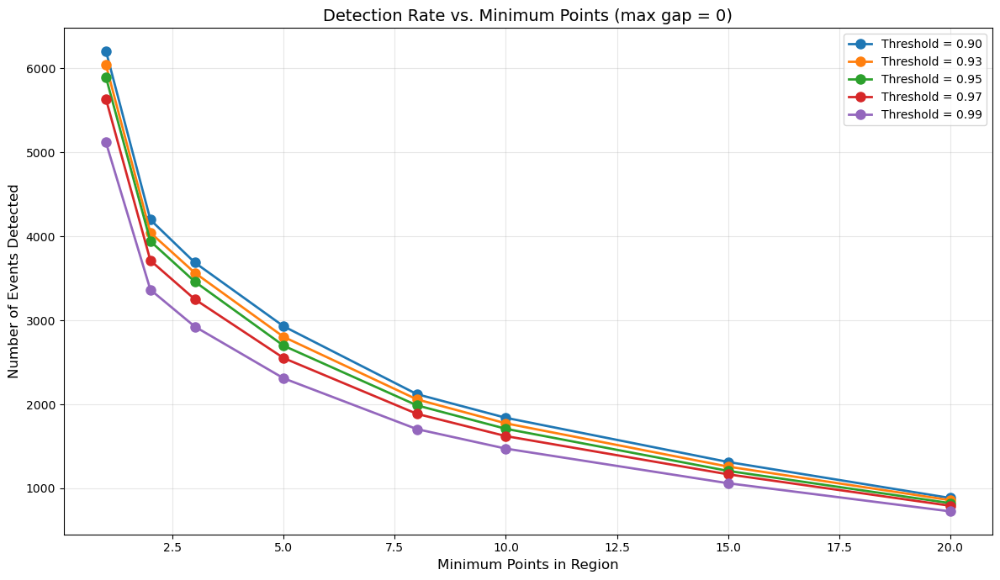

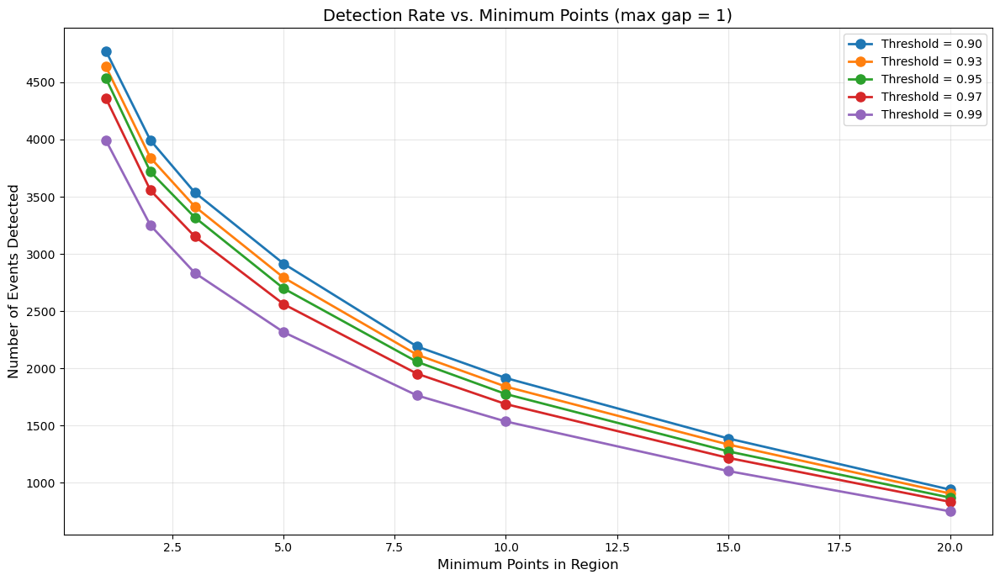

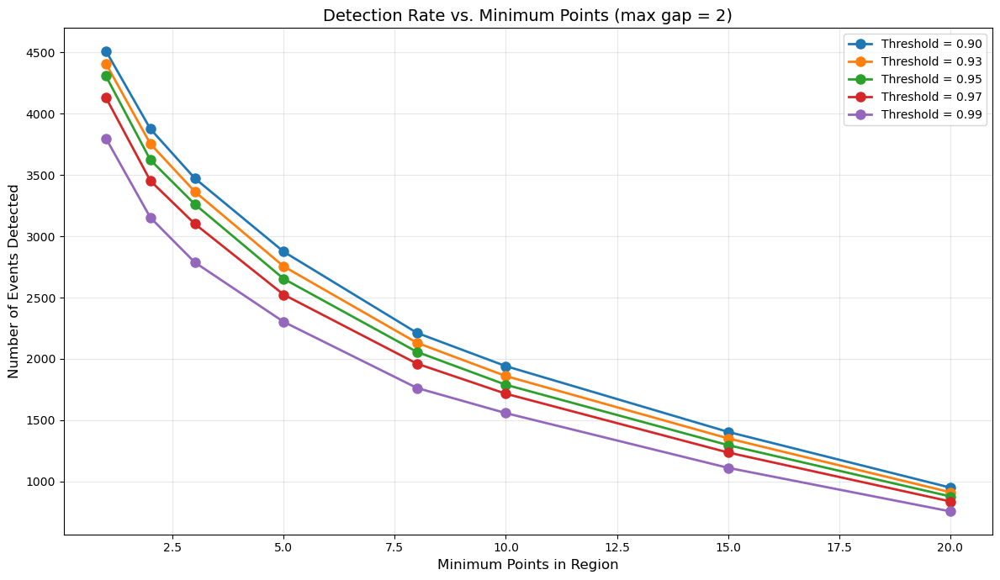

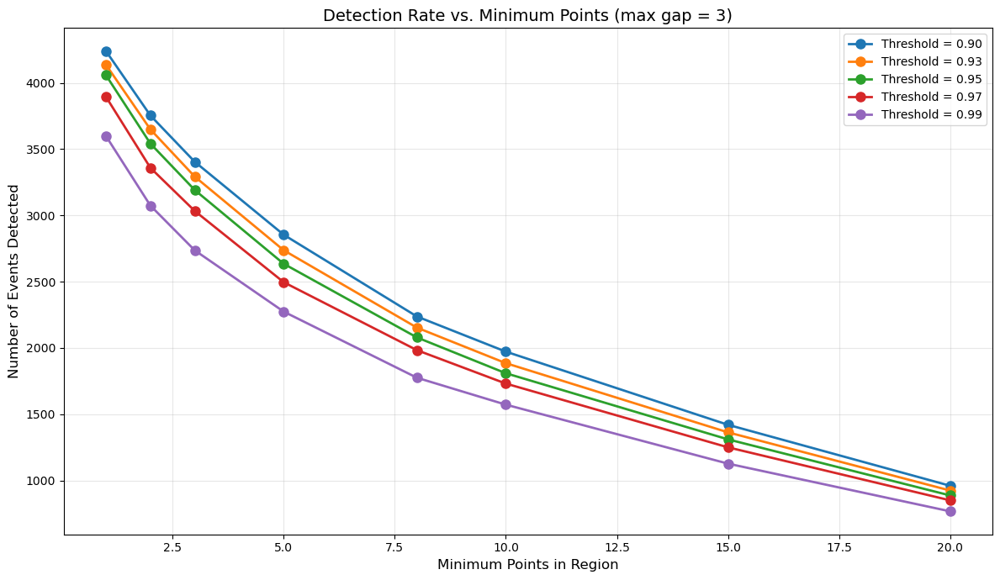

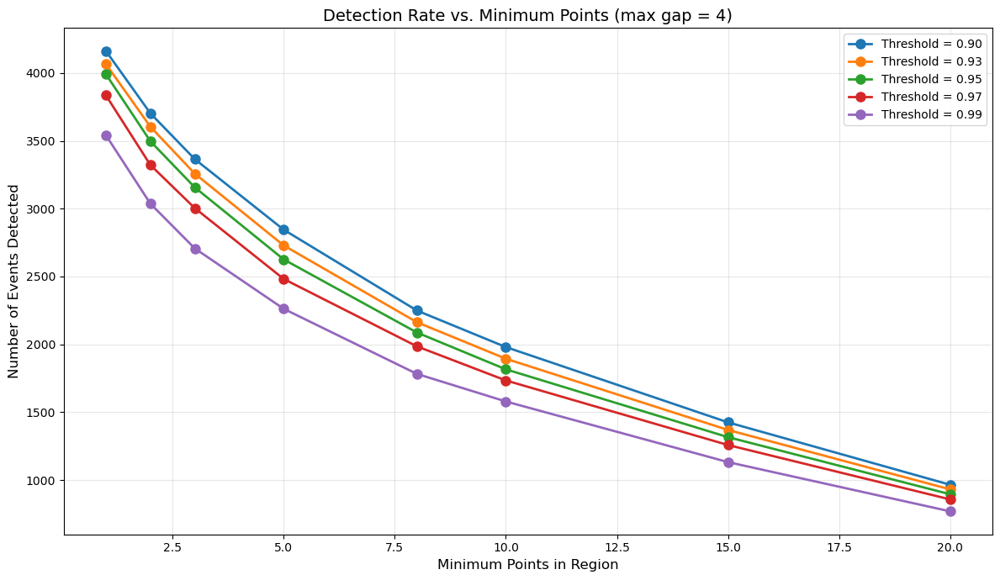

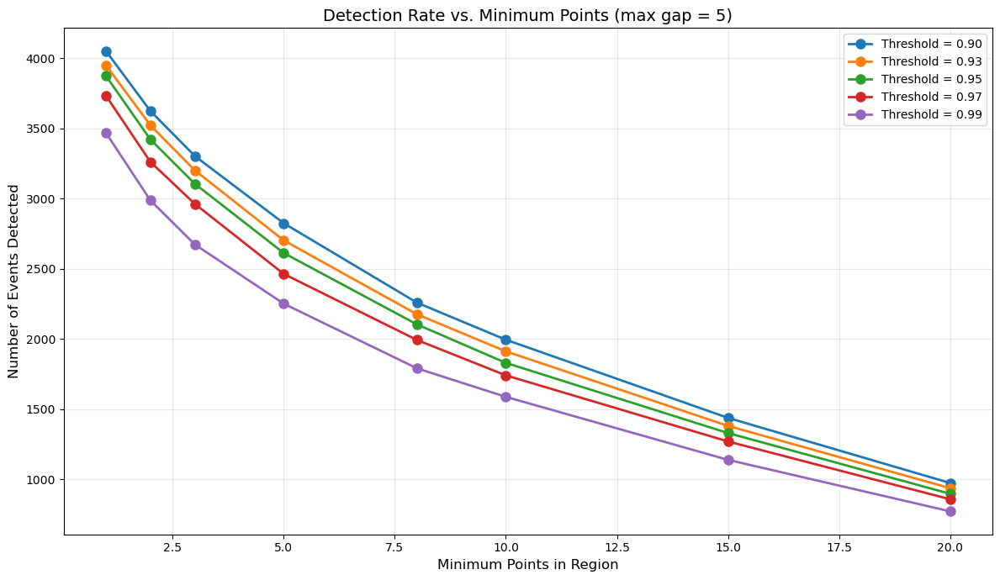

In [120]:
for i in range(0,6):
    event_counts = generate_sensitivity_plot_with_relaxed_criteria(df, max_gap=i)

What this plot shows is the minimum consecutive points corresponding to "an event" in the light curves. Caveats:
- If there are points that are high probability but are not consecutive e.g.: indices 832 and 835 have high probabilities, but they are not next to each other, then it counts as **separate events**.
- Maybe I now need to plot light curves where there are **only** one to five points let's say to see what they are like

In [205]:
def plot_preds(row, first_threshold=0.95, neighbor_threshold=0.6, neighbor_window=20):
    preds = row['predictions']
    
    # Find indices where predictions exceed first threshold
    indices = np.where(preds > first_threshold)
    
    # Check if exactly one point exceeds first threshold
    if len(indices[0]) == 1:
        # Get the index of the high prediction
        high_index = indices[0][0]
        
        # Define the neighborhood window
        start = max(0, high_index - neighbor_window)
        end = min(len(preds), high_index + neighbor_window)
        
        # Extract neighboring predictions
        neighbor_preds = preds[start:end]
        
        # Check if average of neighboring predictions is above second threshold
        if np.mean(neighbor_preds) < neighbor_threshold:
            return True
    
    return False

# Filter the DataFrame
test = df[df.apply(plot_preds, axis=1)].reset_index()

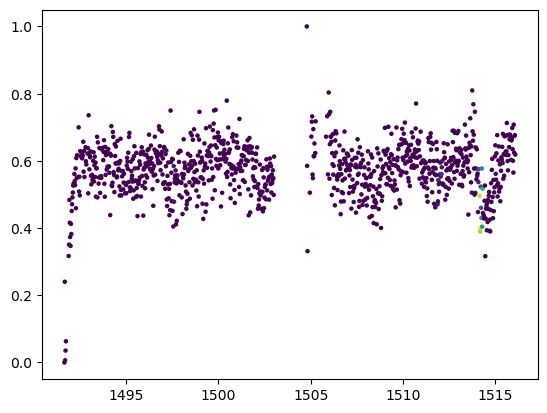

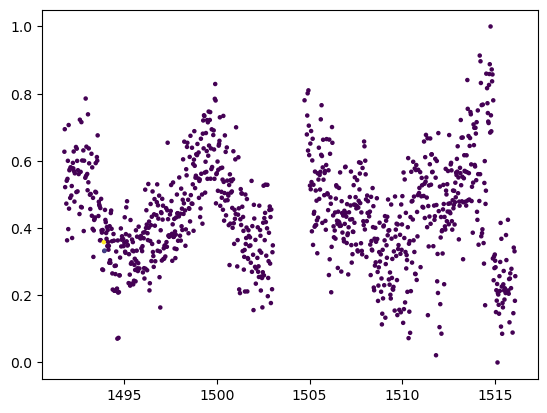

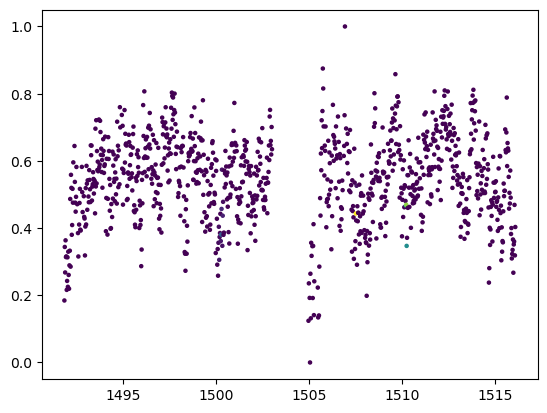

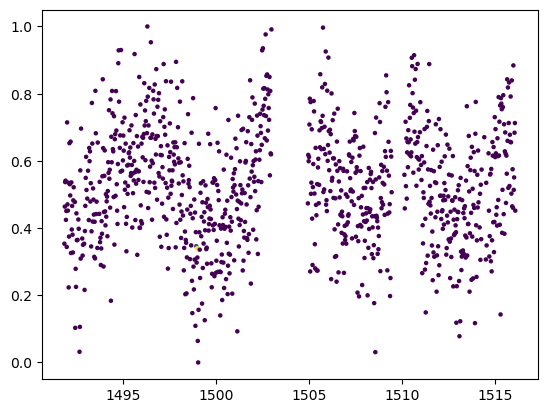

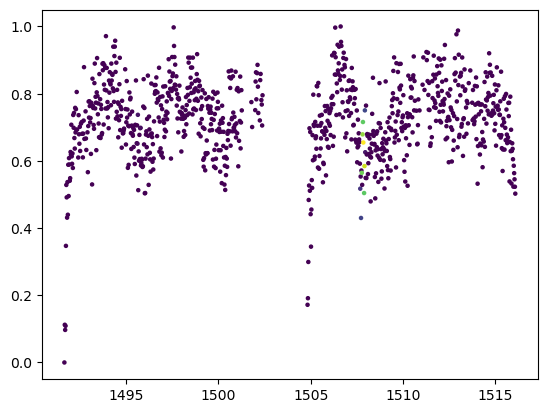

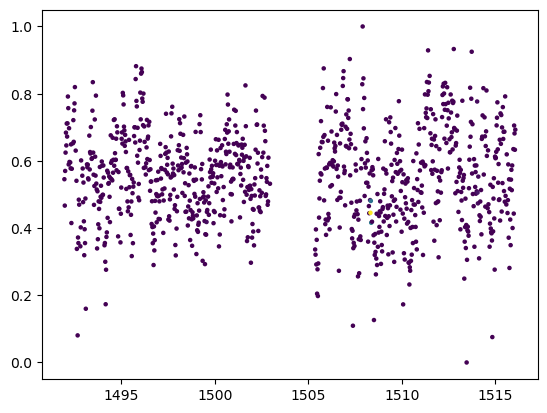

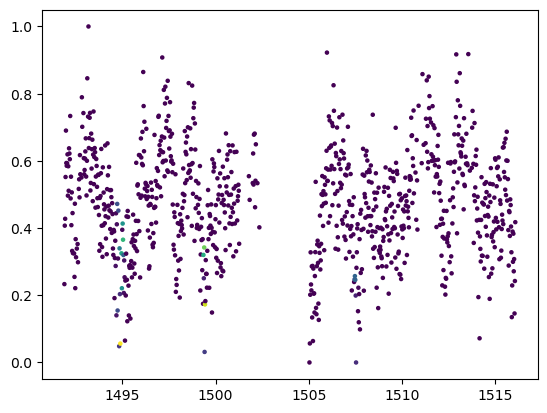

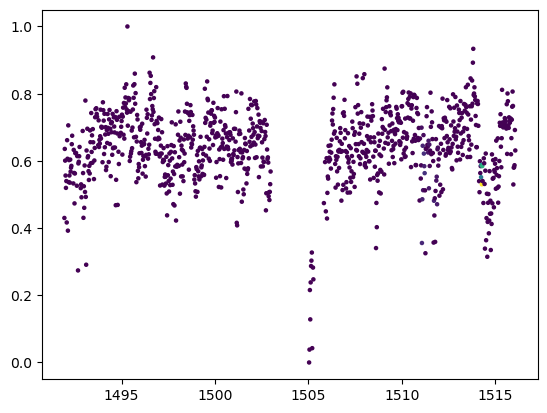

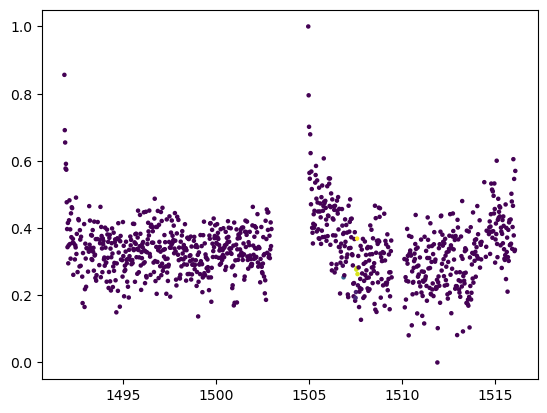

In [207]:
for i in test.index[6:15]:
    time = test.iloc[i]['time']
    flux = test.iloc[i]['flux']
    preds = test.iloc[i]['predictions']
    plt.scatter(time,flux,c=preds,s=5)
    plt.show()

---


In [211]:
import stella

In [217]:
ids = []
times = []
fluxes = []
predictions = []
for target_id in df['ID'].unique():
    target_data = df[df['ID'] == target_id]
    ids.append(target_id)
    times.append(target_data['time'].values)
    fluxes.append(target_data['flux'].values)
    predictions.append(target_data['predictions'].values)

In [223]:
finder = stella.ExocometFinder(ids,times,fluxes,predictions=predictions)

Creating dummy flux errors (1% of flux values)


In [226]:
# Group and prepare data
ids = []
times = []
fluxes = []
predictions = []

for target_id in df['ID'].unique():
    target_data = df[df['ID'] == target_id]
    
    # Add the target ID
    ids.append(target_id)
    
    # Get time and flux as 1D arrays
    times.append(target_data['time'].values)
    fluxes.append(target_data['flux'].values)
    
    # Handle predictions - make sure they're 1D arrays
    pred_array = target_data['predictions'].values
    if isinstance(pred_array[0], (list, np.ndarray)):
        # If predictions are nested arrays, flatten them
        pred_array = np.ravel(pred_array)
    predictions.append(pred_array)
    

# Create finder with prepared data
finder = stella.ExocometFinder(
    id=ids,
    time=times,
    flux=fluxes,
    predictions=predictions
)

# Then run the finder
transits = finder.identify_exocomet_transits(
    high_threshold=0.9,
    low_threshold=0.5,
    max_gap=20,
    min_points=5
)

Creating dummy flux errors (1% of flux values)


Finding Exocomet Transits:   0%|         | 0/1545 [00:00<?, ?it/s]


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [227]:
predictions

[array([array([0.00176911, 0.00176911, 0.00176911, ..., 0.00176911, 0.00176911,
               0.00176911])                                                    ],
       dtype=object),
 array([array([0.00176911, 0.00176911, 0.00176911, ..., 0.00176911, 0.00176911,
               0.00176911])                                                    ],
       dtype=object),
 array([array([0.00176911, 0.00176911, 0.00176911, ..., 0.00176911, 0.00176911,
               0.00176911])                                                    ],
       dtype=object),
 array([array([0.00176911, 0.00176911, 0.00176911, ..., 0.00176911, 0.00176911,
               0.00176911])                                                    ],
       dtype=object),
 array([array([0.00176911, 0.00176911, 0.00176911, ..., 0.00176911, 0.00176911,
               0.00176911])                                                    ],
       dtype=object),
 array([array([0.00176911, 0.00176911, 0.00176911, ..., 0.00176911, 0.00176911,
